In [1]:
import models
from collections import OrderedDict
repo = models.Repository.get(models.Repository.shortname == "ouhsc")

db = models.db

In [2]:
from PIL import Image, ImageDraw
import sys

import pyocr
import pyocr.builders

from IPython.display import display
from IPython.display import Image as IPImage
from IPython.core.display import HTML

tools = pyocr.get_available_tools()
if len(tools) == 0:
    print("No OCR tool found")
    sys.exit(1)
# The tools are returned in the recommended order of usage
tool = tools[0]
print("Will use tool '%s'" % (tool.get_name()))
# Ex: Will use tool 'libtesseract'

langs = tool.get_available_languages()
print("Available languages: %s" % ", ".join(langs))
# lang = langs[0]
# print("Will use lang '%s'" % (lang))
# Ex: Will use lang 'fra'
# Note that languages are NOT sorted in any way. Please refer
# to the system locale settings for the default language
# to use.

Will use tool 'Tesseract (sh)'
Available languages: bel, san, ind, por, chi_tra, eng, rus, est, ceb, bos, yid, srp_latn, lit, aze_cyrl, aze, swe, ita_old, grc, spa, spa_old, asm, urd, slv, tha, lav, khm, tam, uzb, ces, mar, epo, nld, ori, kir, cym, deu_frak, dan, msa, pus, mya, mal, kaz, nep, mlt, swa, vie, fra, lat, afr, deu, jpn, hrv, enm, uig, tir, ell, ara, mkd, pol, sqi, equ, kan, chr, glg, frm, bul, slk, nor, cat, hin, iku, ita, hun, slk_frak, bod, osd, ron, ukr, gle_uncial, dan_frak, syr, tgk, ben, eus, isl, sin, guj, srp, fin, uzb_cyrl, heb, fas, kat, jav, tel, gle, amh, hat, tgl, kur, tur, lao, frk, kor, chi_sim, kat_old, dzo, pan


In [3]:
def boxArea(coords):
    x1 = coords[0][0]
    x2 = coords[1][0]
    y1 = coords[0][1]
    y2 = coords[1][1]
    
    return (x2 - x1) * (y2 - y1)

def charsPerUnitArea( content, position ):
    area = boxArea(position)
    chars = len(content)
    
    return chars/area

In [4]:
def box_intersect(a, b):
    # b is center, base. return percent of a inside b.
    a_area = box_area(a)
    
    x1 = max(min(a[0][0], a[1][0]), min(b[0][0], b[1][0]))
    y1 = max(min(a[0][1], a[1][1]), min(b[0][1], b[1][1]))
    x2 = min(max(a[0][0], a[1][0]), max(b[0][0], b[1][0]))
    y2 = min(max(a[0][1], a[1][1]), max(b[0][1], b[1][1]))
    
    if x1<x2 and y1<y2:
#         bound = ( (x1, y1), (x2, y2) )
        return ( ( (x2-x1) * (y2-y1) ) / ( a_area + 0.0 ) )
    else:
        return 0.0
    
def box_area(a):
    a_width = (a[1][0] - a[0][0])
    a_height = (a[1][1] - a[0][1]) 
    a_area = a_width * a_height
    return a_area
    

In [5]:
query = models.Book.select()

for book in query:
    print(book.full_title + " : " + book.uuid)

"A Description of the Plan of Peking, the Capital of China," Philosophical Transactions of the Royal Society of London, Vol. 50, Part 2 : 641949b1-d13d-5821-b238-ae774c4e078f
"Epistola circa Pythagoricorum, & Copernici opinionem de mobilitate terrae, et stabilitate solis..." in Galileo 1635 Systema cosmicum : 4475e6b4-e08c-541b-9859-e23c9516161a
"Sketch of the Analytical Engine Invented by Charles Babbage by L.F. Menabrea... with Notes," in Scientific Memoirs, vol. 3, pp. 666-731. : 6235e086-c11a-56f6-b50d-1b1f5aaa3f5e
"The Systeme of the World in Four Dialogues" in Thomas Salusbury, Mathematical Discourses, 1661 : b1d3db8e-2865-5acb-88f8-a67dc19d20c2
A Prognostication euerlasting of right good effect...; Lately corrected and augmented by Thomas Digges his sonne : 8a974a11-d382-5b59-a156-b7cc85aef383
A Week's Conversation on the Plurality of Worlds [Entretiens sur la pluralite des mondes] : eb14a997-6891-5fdf-ad81-7a646581e317
Admonitio ad astronomos : 0918f030-2c26-59f4-ba72-ba495545f

In [49]:
keepcharacters = (' ', '.', '_');

chosen_book_uuid = "6124c2d3-1863-5967-8d6b-4215f60a7d17"

query = models.Book.select()
    
# query = models.Book.select().where(
# #     (models.Page.full_size_downloaded == True) &
#     (models.Book.uuid == chosen_book_uuid)
# )

files = []

for i, book in enumerate(query):
    
    book_title = "".join( c for c in book.full_title if c.isalnum() or c in keepcharacters ).rstrip()
#     print(book_title)
    
    meta = eval(book.mods_metadata)
    
    try:
        lang = meta["mods"]["language"][0]["languageTerm"]["#text"]
#         print(lang)
    except:
        try:
            lang = meta["mods"]["language"]["languageTerm"]["#text"]
#             print(lang)
        except:
            lang = "eng"
            print(book_title)
#             print()
#             break
        
#     print(meta["mods"]["language"][2])
#     print(meta["mods"]["language"][0]["languageTerm"]["#text"])
#     lang = meta["mods"]["language"]["languageTerm"]["#text"]
    
    
    
#     files_path = "/home/eth/lorisal/lorisal/data/ouhsc/"+ book_title + "/10/"
    
    for page in book.pages:
        if page.ocr_text is None:
            print(page.ocr_text)
# #         print("-" + str(page.full_size_downloaded))
#         if page.full_size_downloaded:
#             files.append( files_path + page.uuid + ".jpg" )

200
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
200
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
No

In [7]:
print(len(files))

chosen = 61

105


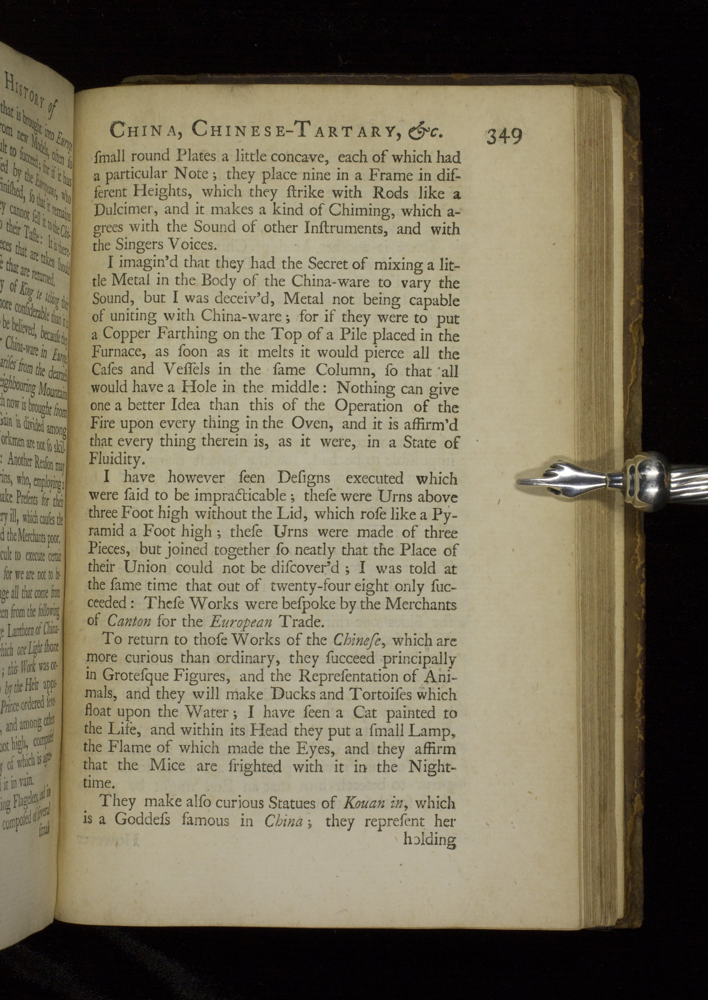

In [8]:
display(IPImage(filename = files[chosen], width=400, height=400))

## Start PillowFight

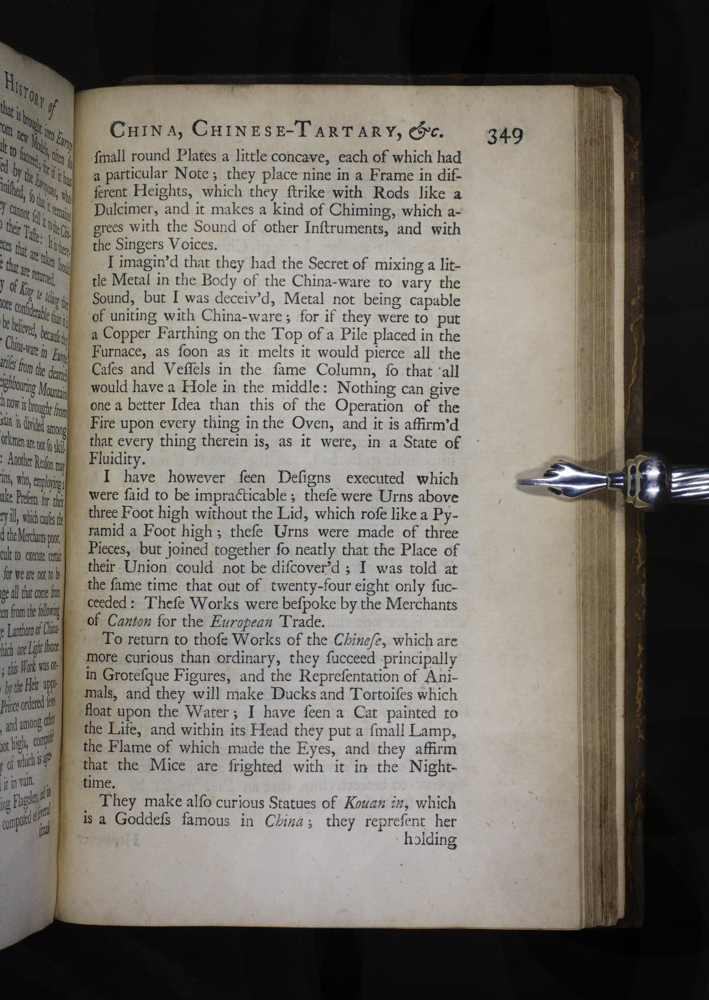

In [9]:
import pillowfight

basewidth = 1624
# input_img = Image.open(test_img)
input_img = Image.open(files[chosen])
hsize = int(basewidth / input_img.width * input_img.height)
input_img = input_img.resize((basewidth,hsize), Image.ANTIALIAS)
output_img = pillowfight.ace(input_img)
# output_img2 = pillowfight.unpaper_masks(output_img)
# display(input_img)
display(output_img)
# display(output_img2)

## Start Tesseract

In [10]:
# lang = 'eng'
# files_path = "/home/eth/lorisal/lorisal/data/ouhsc/Rosa Vrsina/3/"
# file_name = "d929d4a5-c0ae-5b38-9edc-6e3bc7be2649.jpg"

line_and_word_boxes0 = tool.image_to_string(
    output_img, lang=lang,
#     Image.open(files[chosen]), lang=lang,
    builder=pyocr.builders.LineBoxBuilder()
)
# list of line objects. For each line object:
#   line.word_boxes is a list of word boxes (the individual words in the line)
#   line.content is the whole text of the line
#   line.position is the position of the whole line on the page (in pixels)
#
# Beware that some OCR tools (Tesseract for instance)
# may return empty boxes

# Digits - Only Tesseract (not 'libtesseract' yet !)
# digits = tool.image_to_string(
    # Image.open('test-digits.png'),
    # lang=lang,
    # builder=pyocr.tesseract.DigitBuilder()
# )
# digits is a python string

In [11]:
len(line_and_word_boxes0)

90

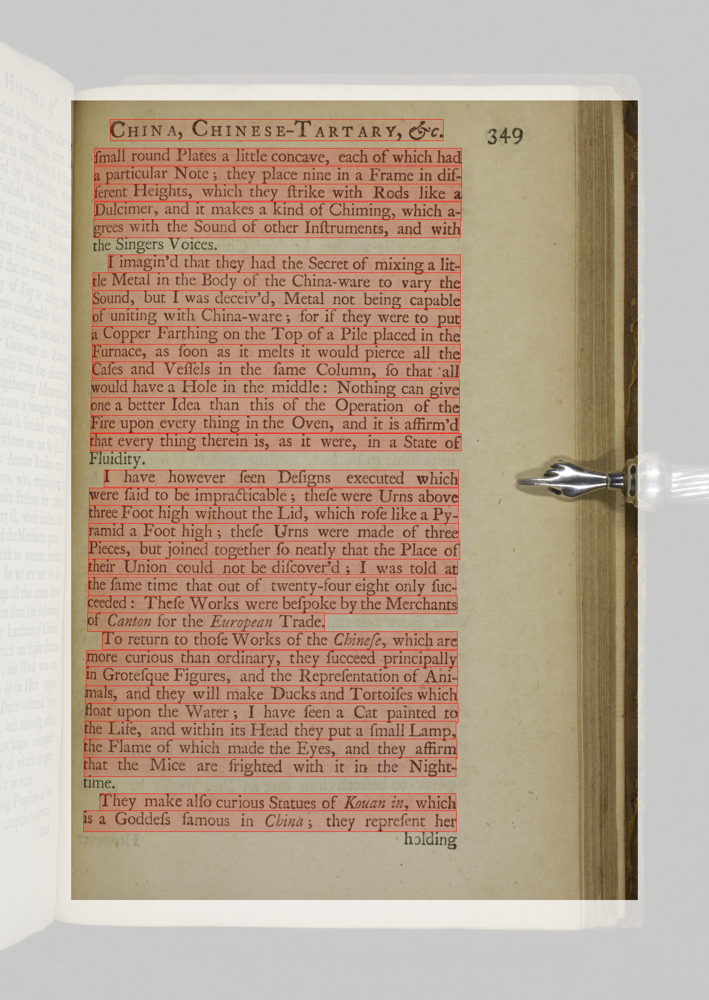

In [12]:
im = Image.open(files[chosen], mode='r')
im = im.convert("RGBA")
im = im.resize((basewidth,hsize), Image.ANTIALIAS)
bg = Image.new('RGBA', im.size, (255,255,255,0))
recs = ImageDraw.Draw(bg)
draw = ImageDraw.Draw(im)

center_boundaries = ( (int(0.1*im.width), int(0.1*im.height) ), (int(0.9*im.width), int(0.9*im.height)) )

#draw mask top rec
recs.rectangle( ( (0,0) , (im.width,center_boundaries[0][1]) ), fill=(255,255,255,200))
recs.rectangle( ( (0, center_boundaries[1][1] ), (im.width, im.height) ), fill=(255,255,255,200))
recs.rectangle( ( (0,0) , (center_boundaries[0][0],im.height) ), fill=(255,255,255,200))
recs.rectangle( ( (center_boundaries[1][0],0) , (im.width,im.height) ), fill=(255,255,255,200))

# a, b, c, d = line_and_word_boxes0[4].position
# print(a)
# print(b)
# print(c)
# print(d)
for i, box in enumerate(line_and_word_boxes0):
    contentAmount = min(255, int(charsPerUnitArea(box.content, box.position) * 100 * 255) )
    if (
        # if 85% of box is in main page area
        (box_intersect(box.position, center_boundaries) > .85) and
        # if box is bigger than 1% of the image
        ( (box_area(box.position) / (im.width*im.height + 0.0) ) > 0.005 )
    ):
        #draw rectangle with darker opacity for more character density.
        if (contentAmount < 10):
            recs.rectangle(box.position, fill=(0,255,0, contentAmount*10), outline="rgb(255,0,0)")
            print("Image found" + str(contentAmount));
        else:
            recs.rectangle(box.position, fill=(255,0,0, contentAmount), outline="rgb(255,0,0)")
#     print( str(i) + ": " + str(contentAmount) )

composite = Image.alpha_composite(im, bg)
# composite = ImageChops.blend(im, bg, 0.5)
    
display(composite)
# display(composite.resize( (basewidth//2, hsize//2), Image.ANTIALIAS) )

In [19]:
line_and_word_boxes0[0].word_boxes[0].__dict__

{'content': '  ', 'position': ((0, 249), (252, 346))}